<a href="https://colab.research.google.com/github/dream-codee/Generic-_static_directory/blob/main/California_Housing_Prices_ADT_PROJECT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

First Name: Saba

Last Name:Minhaj

Student ID:100001743

# California housing
The California Housing dataset contains information from the 1990 U.S. Census about various factors influencing housing prices in California. It includes 20,640 samples, each representing a block group, with the following features:

- **MedInc**: Median income in the block group.
- **HouseAge**: Median house age in the block group.
- **AveRooms**: Average number of rooms per household.
- **AveBedrms**: Average number of bedrooms per household.
- **Population**: Total population in the block group.
- **AveOccup**: Average number of household members.
- **Latitude**: Block group latitude.
- **Longitude**: Block group longitude.

The target variable is the median house value for each block group, expressed in hundreds of thousands of dollars.

This dataset is commonly used for regression tasks to predict housing prices based on the provided features.


## Your task

To analyze the California Housing dataset and predict median house values, follow these steps:

1. **Data Acquisition and Exploration**:
   - **Load the Dataset**: Use `fetch_california_housing` from scikit-learn to load the data.
   - **Examine Data Structure**: Check the first few rows, data types, and summary statistics to understand the dataset's structure.
   - **Visualize Distributions**: Plot histograms for each feature to observe their distributions.
   - **Assess Correlations**: Compute the correlation matrix and visualize it using a heatmap to identify relationships between features and the target variable.

2. **Data Preparation**:
   - **Handle Missing Values**: Although this dataset has no missing values, in general, check for and address any missing data.
   - **Feature Engineering**: Create new features if beneficial, such as interaction terms or polynomial features.
   - **Data Splitting**: Divide the data into training and testing sets using `train_test_split`.
   - **Feature Scaling**: Standardize or normalize features to ensure they are on a similar scale, especially for algorithms sensitive to feature scaling.

3. **Modeling**:
   - **Linear Regression**: Fit a linear regression model to the training data.
   - **Explore Other Algorithms**: Experiment with models like Decision Trees, Random Forests, or Gradient Boosting to potentially improve performance.

4. **Model Validation**:
   - **Cross-Validation**: Use techniques like K-Fold cross-validation to assess model performance across different subsets of the data.
   - **Evaluation Metrics**: Calculate metrics such as Mean Squared Error (MSE) and R-squared to evaluate model accuracy.

5. **Feature Importance Analysis**:
   - **Coefficient Inspection**: For linear models, examine the magnitude and direction of coefficients to determine feature impact.
   - **Feature Elimination**: Apply methods like Recursive Feature Elimination (RFE) to rank and select the most influential features.

For a practical implementation, you can refer to this GitHub repository, which provides a comprehensive analysis of the California Housing dataset, including data preprocessing, feature engineering, model building, and validation techniques:


Recursive Feature Elimination (RFE) is a technique that iteratively removes the least important features from a model to enhance performance. By training the model and eliminating less significant features in each iteration, RFE identifies the most influential features for accurate predictions. This method is particularly useful for improving model efficiency and interpretability.  


This is an open ended task, be creative and experiment!



# **Exploratory data analysis**

#Data Loading and Overview

In [ ]:
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from pandas.plotting import scatter_matrix

# Load the dataset
california_housing = fetch_california_housing(as_frame=True)

In [ ]:
df = california_housing.frame  # get all the data in a single data frame.
target = california_housing.target_names  # The list of target varibles.
features = california_housing.feature_names # The list of features.

In [ ]:
df.shape

(20640, 9)

In [ ]:
print(df.info())  # Check data types and missing values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   MedInc       20640 non-null  float64
 1   HouseAge     20640 non-null  float64
 2   AveRooms     20640 non-null  float64
 3   AveBedrms    20640 non-null  float64
 4   Population   20640 non-null  float64
 5   AveOccup     20640 non-null  float64
 6   Latitude     20640 non-null  float64
 7   Longitude    20640 non-null  float64
 8   MedHouseVal  20640 non-null  float64
dtypes: float64(9)
memory usage: 1.4 MB
None


In [ ]:
print(df.describe())  # Summary statistics

             MedInc      HouseAge      AveRooms     AveBedrms    Population  \
count  20640.000000  20640.000000  20640.000000  20640.000000  20640.000000   
mean       3.870671     28.639486      5.429000      1.096675   1425.476744   
std        1.899822     12.585558      2.474173      0.473911   1132.462122   
min        0.499900      1.000000      0.846154      0.333333      3.000000   
25%        2.563400     18.000000      4.440716      1.006079    787.000000   
50%        3.534800     29.000000      5.229129      1.048780   1166.000000   
75%        4.743250     37.000000      6.052381      1.099526   1725.000000   
max       15.000100     52.000000    141.909091     34.066667  35682.000000   

           AveOccup      Latitude     Longitude   MedHouseVal  
count  20640.000000  20640.000000  20640.000000  20640.000000  
mean       3.070655     35.631861   -119.569704      2.068558  
std       10.386050      2.135952      2.003532      1.153956  
min        0.692308     32.54000

In [ ]:
df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


In [ ]:
df.tail()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
20635,1.5603,25.0,5.045455,1.133333,845.0,2.560606,39.48,-121.09,0.781
20636,2.5568,18.0,6.114035,1.315789,356.0,3.122807,39.49,-121.21,0.771
20637,1.7000,17.0,5.205543,1.120092,1007.0,2.325635,39.43,-121.22,0.923
20638,1.8672,18.0,5.329513,1.171920,741.0,2.123209,39.43,-121.32,0.847
20639,2.3886,16.0,5.254717,1.162264,1387.0,2.616981,39.37,-121.24,0.894


In [ ]:
df.corr()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
MedInc,1.000000,-0.119034,0.326895,-0.062040,0.004834,0.018766,-0.079809,-0.015176,0.688075
HouseAge,-0.119034,1.000000,-0.153277,-0.077747,-0.296244,0.013191,0.011173,-0.108197,0.105623
AveRooms,0.326895,-0.153277,1.000000,0.847621,-0.072213,-0.004852,0.106389,-0.027540,0.151948
AveBedrms,-0.062040,-0.077747,0.847621,1.000000,-0.066197,-0.006181,0.069721,0.013344,-0.046701
Population,0.004834,-0.296244,-0.072213,-0.066197,1.000000,0.069863,-0.108785,0.099773,-0.024650
AveOccup,0.018766,0.013191,-0.004852,-0.006181,0.069863,1.000000,0.002366,0.002476,-0.023737
Latitude,-0.079809,0.011173,0.106389,0.069721,-0.108785,0.002366,1.000000,-0.924664,-0.144160
Longitude,-0.015176,-0.108197,-0.027540,0.013344,0.099773,0.002476,-0.924664,1.000000,-0.045967
MedHouseVal,0.688075,0.105623,0.151948,-0.046701,-0.024650,-0.023737,-0.144160,-0.045967,1.000000


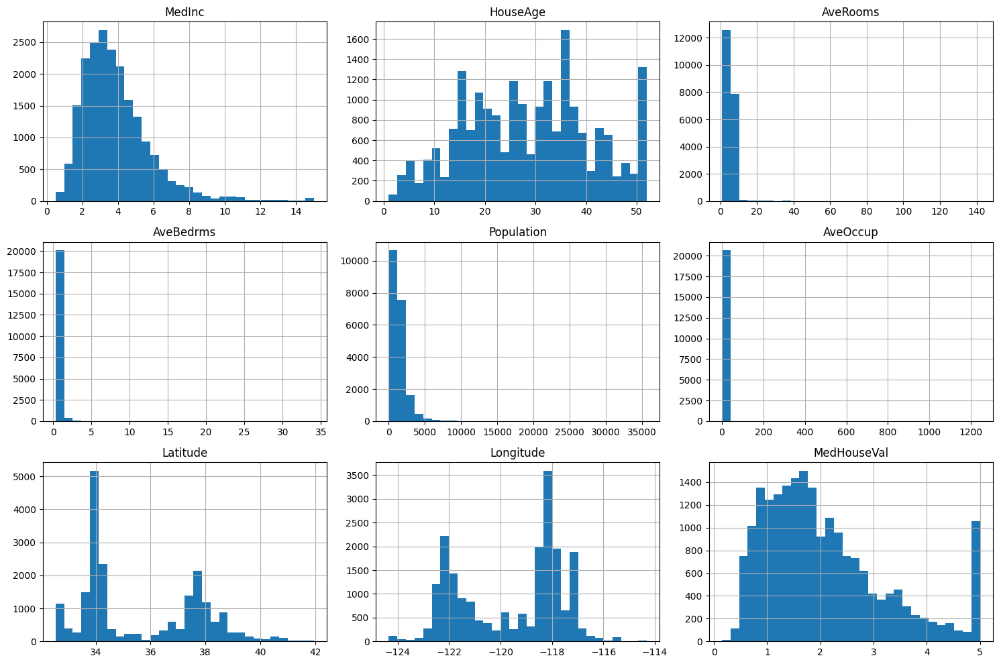

In [ ]:
# Visualize Distributions
df.hist(bins=30, figsize=(15, 10))
plt.tight_layout()
plt.show()

In [ ]:
features_of_interest = ["AveRooms", "AveBedrms", "AveOccup", "Population"]
california_housing.frame[features_of_interest].describe()

,AveRooms,AveBedrms,AveOccup,Population
count,20640.000000,20640.000000,20640.000000,20640.000000
mean,5.429000,1.096675,3.070655,1425.476744
std,2.474173,0.473911,10.386050,1132.462122
min,0.846154,0.333333,0.692308,3.000000
25%,4.440716,1.006079,2.429741,787.000000
50%,5.229129,1.048780,2.818116,1166.000000
75%,6.052381,1.099526,3.282261,1725.000000
max,141.909091,34.066667,1243.333333,35682.000000


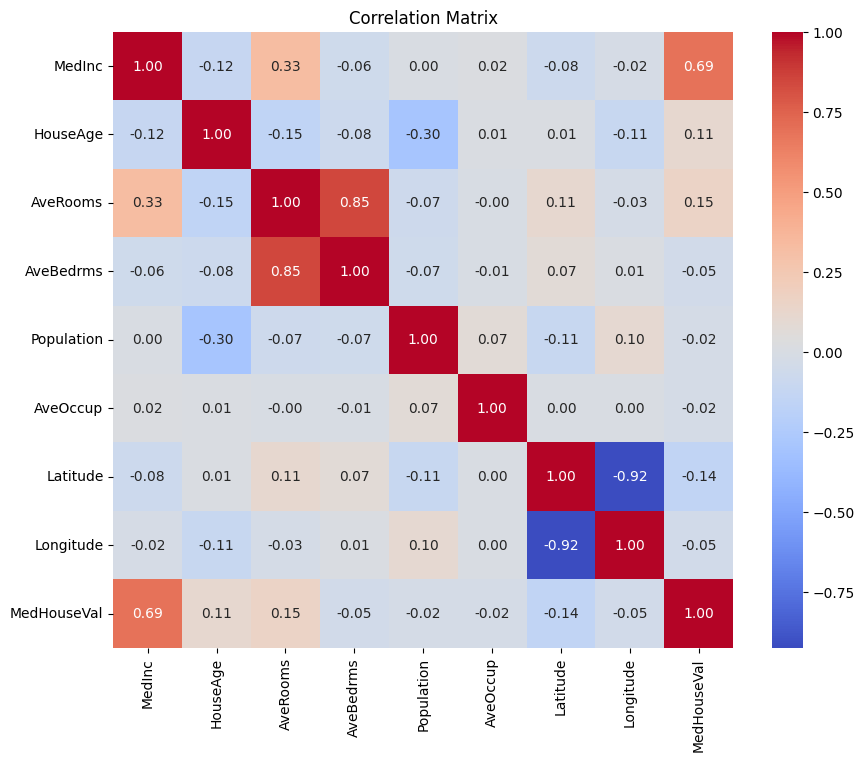

In [ ]:
# Assess Correlations
correlation_matrix = df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

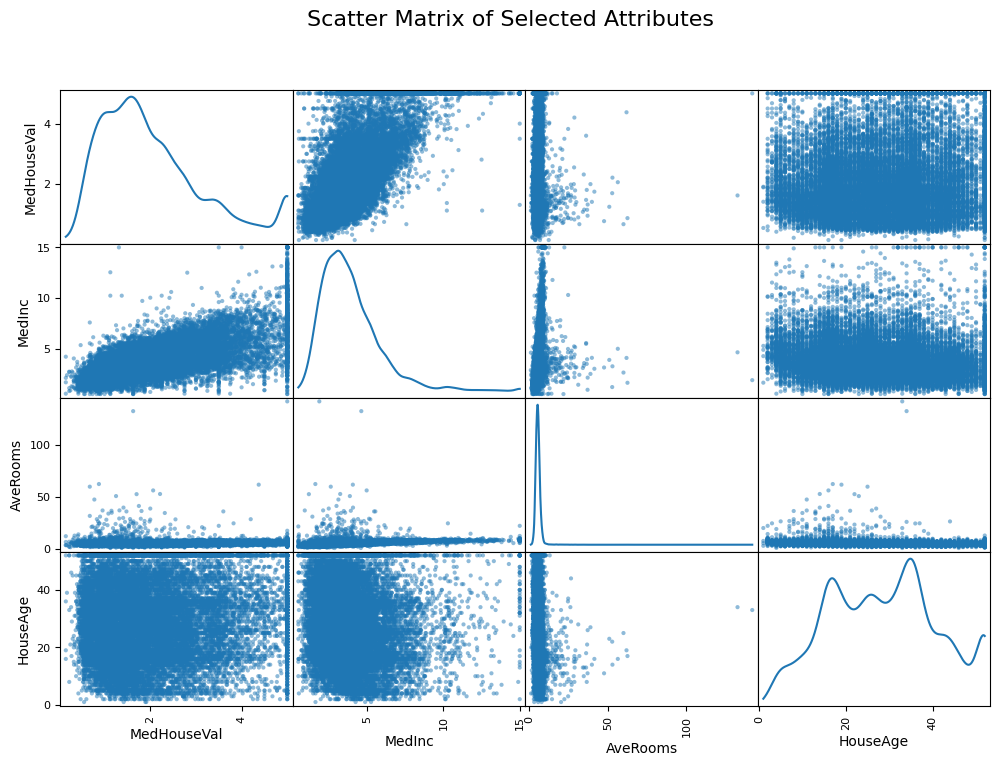

In [ ]:
# Fetch the California housing dataset
california_housing = fetch_california_housing(as_frame=True)

# Create a DataFrame from the fetched data
housing = california_housing.frame

# Select attributes for the scatter matrix
attributes = ["MedHouseVal", "MedInc", "AveRooms", "HouseAge"]  # Corrected feature names

# Create a scatter matrix
scatter_matrix(housing[attributes], figsize=(12, 8), alpha=0.5, diagonal='kde')

# Show the plot
plt.suptitle("Scatter Matrix of Selected Attributes", fontsize=16)
plt.show()


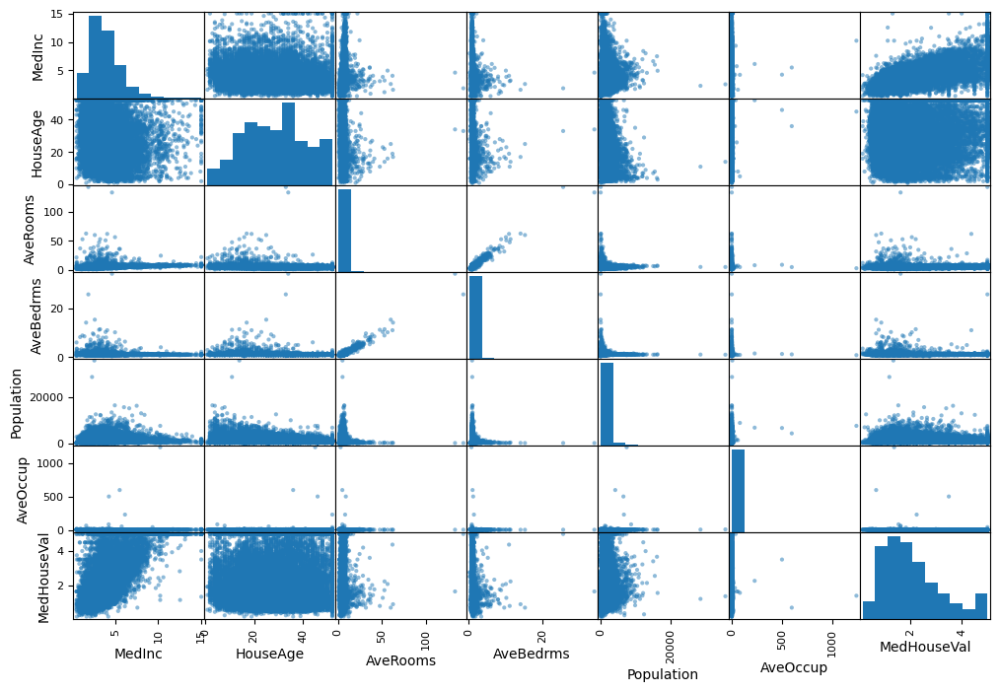

In [ ]:
attributes = ['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup','MedHouseVal']
scatter_matrix(housing[attributes], figsize=(12,8))
plt.show()

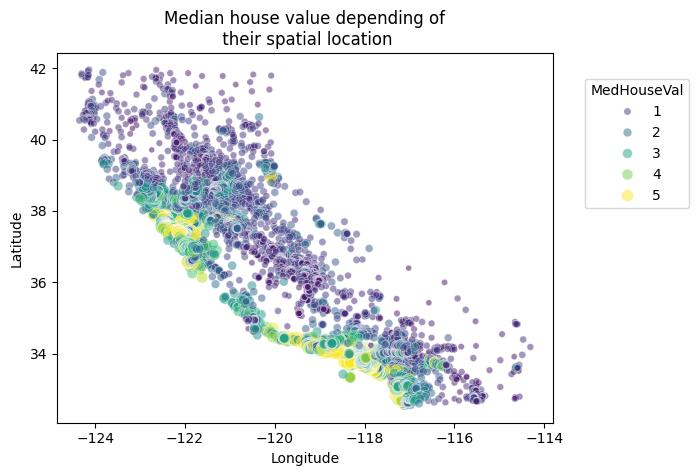

In [ ]:
import seaborn as sns

sns.scatterplot(
    data=california_housing.frame,
    x="Longitude",
    y="Latitude",
    size="MedHouseVal",
    hue="MedHouseVal",
    palette="viridis",
    alpha=0.5,
)
plt.legend(title="MedHouseVal", bbox_to_anchor=(1.05, 0.95), loc="upper left")
_ = plt.title("Median house value depending of\n their spatial location")

In [ ]:
import numpy as np

rng = np.random.RandomState(0)
indices = rng.choice(
    np.arange(california_housing.frame.shape[0]), size=500, replace=False
)

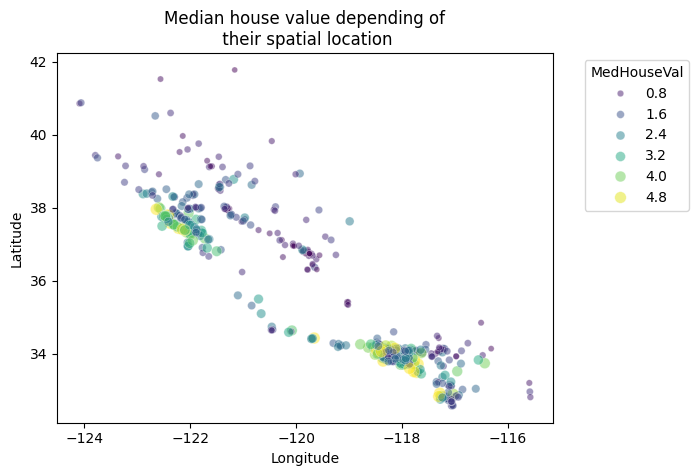

In [ ]:
sns.scatterplot(
    data=california_housing.frame.iloc[indices],
    x="Longitude",
    y="Latitude",
    size="MedHouseVal",
    hue="MedHouseVal",
    palette="viridis",
    alpha=0.5,
)
plt.legend(title="MedHouseVal", bbox_to_anchor=(1.05, 1), loc="upper left")
_ = plt.title("Median house value depending of\n their spatial location")

In [ ]:
import pandas as pd

# Drop the unwanted columns
columns_drop = ["Longitude", "Latitude"]
subset = california_housing.frame.iloc[indices].drop(columns=columns_drop)
# Quantize the target and keep the midpoint for each interval
subset["MedHouseVal"] = pd.qcut(subset["MedHouseVal"], 6, retbins=False)
subset["MedHouseVal"] = subset["MedHouseVal"].apply(lambda x: x.mid)

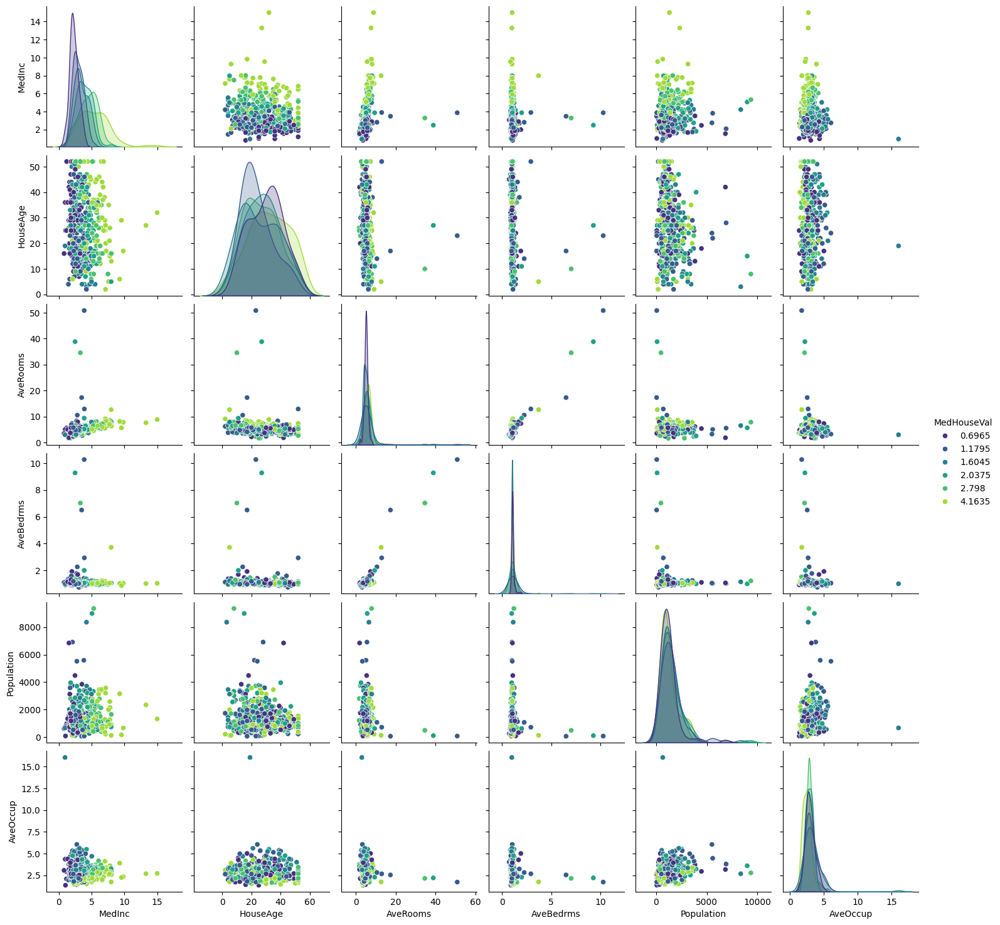

In [ ]:
_ = sns.pairplot(data=subset, hue="MedHouseVal", palette="viridis")

# **Data Preparation**

In [ ]:
# Check for missing values
print(df.isnull().sum())

# This dataset does not have missing values, but if there were any:
# df.fillna(method='ffill', inplace=True)  # Example of forward filling


MedInc         0
HouseAge       0
AveRooms       0
AveBedrms      0
Population     0
AveOccup       0
Latitude       0
Longitude      0
MedHouseVal    0
dtype: int64


In [ ]:
# Create derived features
df['RoomsPerHousehold'] = df['AveRooms'] / df['AveOccup']

# Create another feature: bedrooms per room
df['BedroomsPerRoom'] = df['AveBedrms'] / df['AveRooms']

# Create a feature for population per household
df['PopulationPerHousehold'] = df['Population'] / df['AveOccup']


In [ ]:
print(df[['RoomsPerHousehold', 'BedroomsPerRoom', 'PopulationPerHousehold']].head())

   RoomsPerHousehold  BedroomsPerRoom  PopulationPerHousehold
0           2.732919         0.146591                   126.0
1           2.956685         0.155797                  1138.0
2           2.957661         0.129516                   177.0
3           2.283154         0.184458                   219.0
4           2.879646         0.172096                   259.0


In [ ]:
print(df[['RoomsPerHousehold', 'BedroomsPerRoom', 'PopulationPerHousehold']].tail())

       RoomsPerHousehold  BedroomsPerRoom  PopulationPerHousehold
20635           1.970414         0.224625                   330.0
20636           1.957865         0.215208                   114.0
20637           2.238332         0.215173                   433.0
20638           2.510121         0.219892                   349.0
20639           2.007931         0.221185                   530.0


In [ ]:
# Check if any 'AveOccup' or 'AveRooms' are zero
print((df['AveOccup'] == 0).sum())  # Should ideally be 0
print((df['AveRooms'] == 0).sum())  # Should ideally be 0

0
0


In [ ]:
# Drop rows with missing values
df_cleaned = df.dropna()

print(f"Dataset after dropping missing values: {df_cleaned.shape}")

Dataset after dropping missing values: (20640, 12)


In [ ]:
# Fill missing values with the mean of each column
df['RoomsPerHousehold'] = df['RoomsPerHousehold'].fillna(df['RoomsPerHousehold'].mean())
df['BedroomsPerRoom'] = df['BedroomsPerRoom'].fillna(df['BedroomsPerRoom'].mean())
df['PopulationPerHousehold'] = df['PopulationPerHousehold'].fillna(df['PopulationPerHousehold'].mean())


In [ ]:
df['RoomsPerHousehold'] = df['RoomsPerHousehold'].fillna(df['RoomsPerHousehold'].median())
df['BedroomsPerRoom'] = df['BedroomsPerRoom'].fillna(df['BedroomsPerRoom'].median())
df['PopulationPerHousehold'] = df['PopulationPerHousehold'].fillna(df['PopulationPerHousehold'].median())


In [ ]:
df['RoomsPerHousehold'] = df['RoomsPerHousehold'].fillna(0)
df['BedroomsPerRoom'] = df['BedroomsPerRoom'].fillna(0)
df['PopulationPerHousehold'] = df['PopulationPerHousehold'].fillna(0)


In [ ]:
print(df.isnull().sum())

MedInc                    0
HouseAge                  0
AveRooms                  0
AveBedrms                 0
Population                0
AveOccup                  0
Latitude                  0
Longitude                 0
MedHouseVal               0
RoomsPerHousehold         0
BedroomsPerRoom           0
PopulationPerHousehold    0
dtype: int64


In [ ]:
# Step 1: Feature Engineering
# Create derived features
df['RoomsPerHousehold'] = df['AveRooms'] / df['AveOccup']
df['BedroomsPerRoom'] = df['AveBedrms'] / df['AveRooms']
df['PopulationPerHousehold'] = df['Population'] / df['AveOccup']

# Example interaction term: Latitude x Longitude
df['LatLonInteraction'] = df['Latitude'] * df['Longitude']

# Check for missing values in the derived features (optional)
print("Missing values in the new features:")
print(df[['RoomsPerHousehold', 'BedroomsPerRoom', 'PopulationPerHousehold', 'LatLonInteraction']].isnull().sum())

# Handle missing values if needed (e.g., fill missing with 0 or mean)
df.fillna(0, inplace=True)  # Example: Fill missing values with 0

# Check the first few rows to ensure the features have been added
print("Dataset after adding new features:")
print(df.head())


Missing values in the new features:
RoomsPerHousehold         0
BedroomsPerRoom           0
PopulationPerHousehold    0
LatLonInteraction         0
dtype: int64
Dataset after adding new features:
   MedInc  HouseAge  AveRooms  AveBedrms  Population  AveOccup  Latitude  \
0  8.3252      41.0  6.984127   1.023810       322.0  2.555556     37.88   
1  8.3014      21.0  6.238137   0.971880      2401.0  2.109842     37.86   
2  7.2574      52.0  8.288136   1.073446       496.0  2.802260     37.85   
3  5.6431      52.0  5.817352   1.073059       558.0  2.547945     37.85   
4  3.8462      52.0  6.281853   1.081081       565.0  2.181467     37.85   

   Longitude  MedHouseVal  RoomsPerHousehold  BedroomsPerRoom  \
0    -122.23        4.526           2.732919         0.146591   
1    -122.22        3.585           2.956685         0.155797   
2    -122.24        3.521           2.957661         0.129516   
3    -122.25        3.413           2.283154         0.184458   
4    -122.25        3.

In [ ]:
from sklearn.model_selection import train_test_split

# Step 2: Define features (X) and target variable (y)
X = df.drop(columns=["MedHouseVal"])  # Features (exclude the target column)
y = df["MedHouseVal"]  # Target variable

# Perform the train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Check the shapes of the training and testing sets
print(f"X_train shape: {X_train.shape}, X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}, y_test shape: {y_test.shape}")


X_train shape: (16512, 12), X_test shape: (4128, 12)
y_train shape: (16512,), y_test shape: (4128,)


In [ ]:
from sklearn.preprocessing import StandardScaler

# Initialize the scaler
scaler = StandardScaler()

# Fit the scaler on the training set and transform both training and testing sets
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Print a confirmation
print("Feature scaling complete!")
print("Scaled X_train (first 5 rows):")
print(X_train_scaled[:5])
print("Scaled X_test (first 5 rows):")
print(X_test_scaled[:5])

Feature scaling complete!
Scaled X_train (first 5 rows):
[[-0.326196    0.34849025 -0.17491646 -0.20836543  0.76827628  0.05137609
  -1.3728112   1.27258656 -0.55201735 -0.2117846   0.32290591  1.35217693]
 [-0.03584338  1.61811813 -0.40283542 -0.12853018 -0.09890135 -0.11736222
  -0.87669601  0.70916212  0.5269557   0.34218528  0.6720272   0.85163072]
 [ 0.14470145 -1.95271028  0.08821601 -0.25753771 -0.44981806 -0.03227969
  -0.46014647 -0.44760309  0.08229081 -0.66165785 -0.43046109  0.27899603]
 [-1.01786438  0.58654547 -0.60001532 -0.14515634 -0.00743434  0.07750687
  -1.38217186  1.23269811 -0.86914299  0.78303162 -0.38058662  1.35132958]
 [-0.17148831  1.14200767  0.3490073   0.08662432 -0.48587717 -0.06883176
   0.5320839  -0.10855122  0.66159977 -0.55036364 -0.31496232 -0.43198418]]
Scaled X_test (first 5 rows):
[[-1.15508475 -0.28632369 -0.52068576 -0.17174603 -0.03030109  0.06740798
   0.1951      0.28534728 -0.79891411  0.53446979 -0.37008673 -0.07791414]
 [-0.70865905  0.1

# **Modelling**

In [ ]:
# Initialize and Train Linear Regression Model
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X_train_scaled, y_train)

LinearRegression()

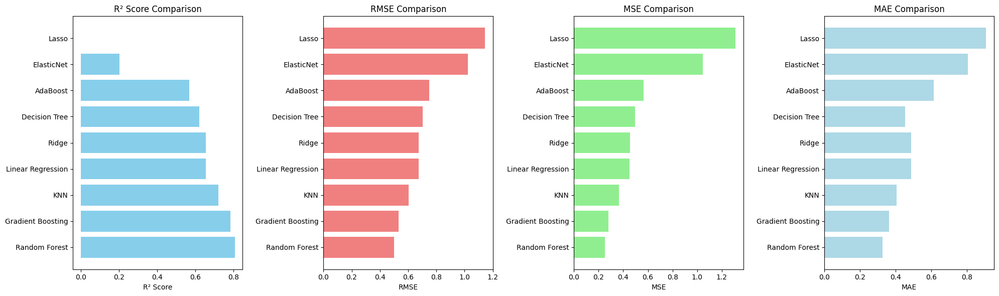


Detailed Model Performance Metrics:
                       R2    RMSE     MAE     MSE
Random Forest      0.8077  0.5019  0.3264  0.2519
Gradient Boosting  0.7849  0.5309  0.3630  0.2819
KNN                0.7220  0.6035  0.4050  0.3643
Linear Regression  0.6542  0.6732  0.4869  0.4531
Ridge              0.6540  0.6734  0.4871  0.4535
Decision Tree      0.6210  0.7047  0.4542  0.4966
AdaBoost           0.5695  0.7511  0.6135  0.5641
ElasticNet         0.2031  1.0219  0.8060  1.0442
Lasso             -0.0002  1.1449  0.9061  1.3107


In [ ]:
# Import necessary models
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Initialize models
models = {
    'Linear Regression': LinearRegression(),
    'Ridge': Ridge(alpha=1.0),
    'Lasso': Lasso(alpha=1.0),
    'ElasticNet': ElasticNet(alpha=1.0, l1_ratio=0.5),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=100, random_state=42),
    'AdaBoost': AdaBoostRegressor(random_state=42),
    'KNN': KNeighborsRegressor(n_neighbors=5)
}

# Dictionary to store results
results = {}

# Train and evaluate each model
for name, model in models.items():
    # Train model
    model.fit(X_train_scaled, y_train)

    # Make predictions
    y_pred = model.predict(X_test_scaled)

    # Calculate metrics
    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)

    # Store results
    results[name] = {
        'R2': r2,
        'RMSE': rmse,
        'MAE': mae,
        'MSE': mse
    }

# Convert results to DataFrame
results_df = pd.DataFrame(results).T

# Sort by R2 score
results_df = results_df.sort_values('R2', ascending=False)

# Plot results
plt.figure(figsize=(20, 6))

# R² Score Comparison
plt.subplot(1, 4, 1)  # Adjusted to accommodate MAE
plt.barh(results_df.index, results_df['R2'], color='skyblue')
plt.title('R² Score Comparison')
plt.xlabel('R² Score')

# RMSE Comparison
plt.subplot(1, 4, 2)  # Adjusted to accommodate MAE
plt.barh(results_df.index, results_df['RMSE'], color='lightcoral')
plt.title('RMSE Comparison')
plt.xlabel('RMSE')

# MSE Comparison
plt.subplot(1, 4, 3)  # New subplot for MSE
plt.barh(results_df.index, results_df['MSE'], color='lightgreen')
plt.title('MSE Comparison')
plt.xlabel('MSE')

# MAE Comparison
plt.subplot(1, 4, 4)  # New subplot for MAE
plt.barh(results_df.index, results_df['MAE'], color='lightblue')
plt.title('MAE Comparison')
plt.xlabel('MAE')

plt.tight_layout()
plt.show()

# Print detailed results
print("\nDetailed Model Performance Metrics:")
print(results_df.round(4))

# **Model Validation**

Processing Linear Regression...
Processing Ridge...
Processing Lasso...
Processing Decision Tree...
Processing Random Forest...


<ipython-input-40-a55792ac811d>:70: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(r2_distributions, labels=models.keys(), vert=False)
<ipython-input-40-a55792ac811d>:80: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(rmse_distributions, labels=models.keys(), vert=False)
<ipython-input-40-a55792ac811d>:90: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(mse_distributions, labels=models.keys(), vert=False)


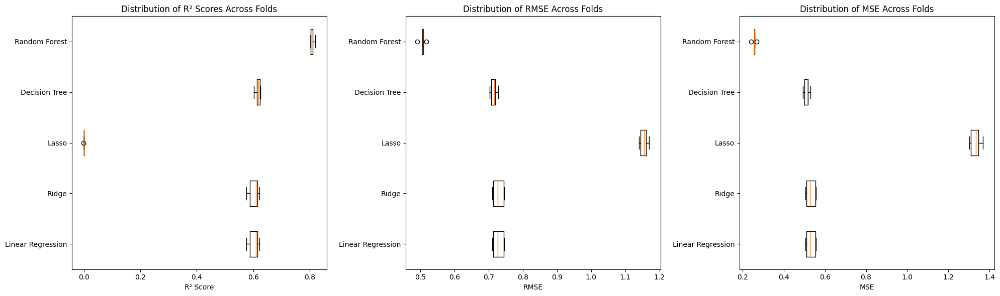

Cross-Validation Results (5-Fold):
                   R2_mean  R2_std  RMSE_mean  RMSE_std  MSE_mean  MSE_std
Random Forest       0.8075  0.0065     0.5062    0.0084    0.2563   0.0084
Decision Tree       0.6162  0.0080     0.7148    0.0089    0.5110   0.0127
Ridge               0.6014  0.0170     0.7282    0.0149    0.5306   0.0218
Linear Regression   0.6014  0.0170     0.7283    0.0149    0.5306   0.0218
Lasso              -0.0003  0.0003     1.1539    0.0103    1.3317   0.0239


In [ ]:
# Import necessary libraries
from sklearn.model_selection import cross_val_score, KFold
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import fetch_california_housing
from sklearn.preprocessing import StandardScaler

# Load California housing dataset
housing = fetch_california_housing()
X = pd.DataFrame(housing.data, columns=housing.feature_names)
y = housing.target

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Define models
models = {
    'Linear Regression': LinearRegression(),
    'Ridge': Ridge(alpha=1.0),
    'Lasso': Lasso(alpha=1.0),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(n_estimators=50, random_state=42)
}

# Set up K-Fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Dictionary to store cross-validation results
cv_results = {}

# Perform cross-validation for each model
for name, model in models.items():
    print(f"Processing {name}...")

    # Calculate R² and RMSE scores in one go
    scores = cross_val_score(model, X_scaled, y, cv=kf, scoring='r2')
    mse_scores = -cross_val_score(model, X_scaled, y, cv=kf, scoring='neg_mean_squared_error')
    rmse_scores = np.sqrt(mse_scores)

    # Store results
    cv_results[name] = {
        'R2_mean': scores.mean(),
        'R2_std': scores.std(),
        'RMSE_mean': rmse_scores.mean(),
        'RMSE_std': rmse_scores.std(),
        'MSE_mean': mse_scores.mean(),  # Include MSE mean
        'MSE_std': mse_scores.std()      # Include MSE std
    }

# Convert results to DataFrame
cv_results_df = pd.DataFrame(cv_results).T

# Sort by mean R² score
cv_results_df = cv_results_df.sort_values('R2_mean', ascending=False)

# Create box plots for R², RMSE, and MSE scores across folds
plt.figure(figsize=(20, 6))

# R² Score Distribution
plt.subplot(1, 3, 1)
r2_distributions = [
    cross_val_score(model, X_scaled, y, cv=kf, scoring='r2')
    for model in models.values()
]
plt.boxplot(r2_distributions, labels=models.keys(), vert=False)
plt.title('Distribution of R² Scores Across Folds')
plt.xlabel('R² Score')

# RMSE Distribution
plt.subplot(1, 3, 2)
rmse_distributions = [
    np.sqrt(-cross_val_score(model, X_scaled, y, cv=kf, scoring='neg_mean_squared_error'))
    for model in models.values()
]
plt.boxplot(rmse_distributions, labels=models.keys(), vert=False)
plt.title('Distribution of RMSE Across Folds')
plt.xlabel('RMSE')

# MSE Distribution
plt.subplot(1, 3, 3)
mse_distributions = [
    -cross_val_score(model, X_scaled, y, cv=kf, scoring='neg_mean_squared_error')
    for model in models.values()
]
plt.boxplot(mse_distributions, labels=models.keys(), vert=False)
plt.title('Distribution of MSE Across Folds')
plt.xlabel('MSE')

plt.tight_layout()
plt.show()

# Print detailed cross-validation results
print("Cross-Validation Results (5-Fold):")
print(cv_results_df.round(4))

# **Feature Importance Analysis**

In [ ]:
# Import necessary libraries
import pandas as pd
from sklearn.datasets import fetch_california_housing
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Load California housing dataset
housing = fetch_california_housing()
X = pd.DataFrame(housing.data, columns=housing.feature_names)
y = housing.target

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Coefficient Inspection
model = LinearRegression()
model.fit(X_train_scaled, y_train)

# Inspect coefficients
coefficients = pd.Series(model.coef_, index=X.columns)
print("Coefficients of the Linear Regression Model:")
print(coefficients)

# Feature Elimination with Recursive Feature Elimination (RFE)
rfe = RFE(model, n_features_to_select=5)  # Specify the number of features to select
rfe.fit(X_train_scaled, y_train)

# Get selected features
selected_features = X.columns[rfe.support_]
print("Selected Features using RFE:", selected_features)

# Optionally, you can also check the ranking of features
feature_ranking = pd.Series(rfe.ranking_, index=X.columns)
print("Feature Ranking (1 is the most important):")
print(feature_ranking)

Coefficients of the Linear Regression Model:
MedInc        0.854383
HouseAge      0.122546
AveRooms     -0.294410
AveBedrms     0.339259
Population   -0.002308
AveOccup     -0.040829
Latitude     -0.896929
Longitude    -0.869842
dtype: float64
Selected Features using RFE: Index(['MedInc', 'AveRooms', 'AveBedrms', 'Latitude', 'Longitude'], dtype='object')
Feature Ranking (1 is the most important):
MedInc        1
HouseAge      2
AveRooms      1
AveBedrms     1
Population    4
AveOccup      3
Latitude      1
Longitude     1
dtype: int64


**The ranking indicates the importance of each feature in the model, where a rank of 1 signifies the most important feature, and higher numbers indicate less important features.**

# **OUT OF THE BOX**

Income Segmentation
Segmenting Data by Income Levels

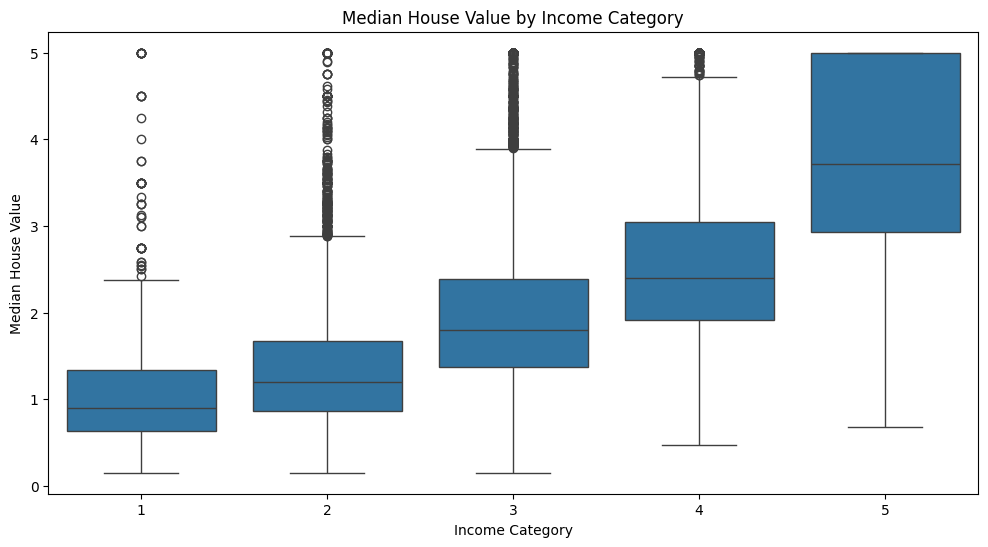

In [ ]:
# Create income categories
df['income_cat'] = pd.cut(df['MedInc'], bins=[0, 1.5, 3, 4.5, 6, float("inf")], labels=[1, 2, 3, 4, 5])

# Box plot of median house values by income category
plt.figure(figsize=(12, 6))
sns.boxplot(x='income_cat', y='MedHouseVal', data=df)
plt.title('Median House Value by Income Category')
plt.xlabel('Income Category')
plt.ylabel('Median House Value')
plt.show()

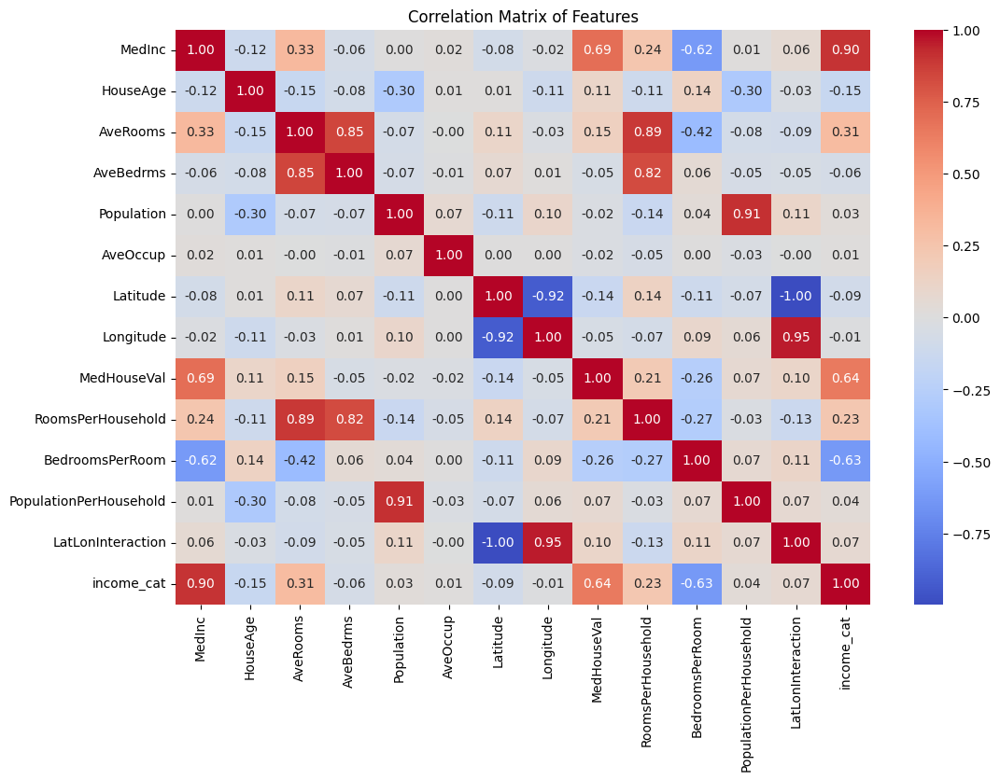

In [ ]:
# Correlation matrix
correlation_matrix = df.corr()

# Heatmap of correlations
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix of Features')
plt.show()

In [ ]:
import pandas as pd
import folium
from folium.plugins import HeatMap, MarkerCluster
from sklearn.datasets import fetch_california_housing

# Step 1: Load the California housing dataset
housing = fetch_california_housing(as_frame=True)
df = housing.frame

# Step 2: Create a base map centered around the mean latitude and longitude
m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=6)

# Step 3: Prepare data for the heatmap
heat_data = [[row['Latitude'], row['Longitude'], row['MedHouseVal']] for index, row in df.iterrows()]

# Step 4: Create a HeatMap layer
heatmap = HeatMap(heat_data, radius=15, blur=10, max_zoom=1)
m.add_child(heatmap)

# Step 5: Create a Marker Cluster for high-value areas
marker_cluster = MarkerCluster().add_to(m)

# Step 6: Add markers for areas with high median house values
high_value_threshold = df['MedHouseVal'].quantile(0.75)  # Top 25% of house values
for index, row in df.iterrows():
    if row['MedHouseVal'] >= high_value_threshold:
        # Determine demand level
        if row['Population'] > df['Population'].median():
            demand_level = "Higher Demand"
        else:
            demand_level = "Lower Demand"

        folium.Marker(
            location=[row['Latitude'], row['Longitude']],
            popup=(
                f"Median House Value: ${row['MedHouseVal']:.2f}<br>"
                f"Population: {row['Population']}<br>"
                f"Demand Level: {demand_level}<br>"
                "This indicates the average house price in the area and the total number of residents."
            ),
            icon=folium.Icon(color='green' if demand_level == "Higher Demand" else 'orange', icon='info-sign')
        ).add_to(marker_cluster)

# Step 7: Add Layer Control
folium.LayerControl().add_to(m)

# Step 8: Add a title and description to the map
title_html = '''
             <h3 align="center" style="font-size: 20px"><b>California Housing Market Analysis</b></h3>
             <h4 align="center" style="font-size: 14px">This map visualizes median house values across California, highlighting areas with high property values and dense populations.</h4>
             '''
m.get_root().html.add_child(folium.Element(title_html))

# Step 9: Save and display the map
m.save('california_housing_heatmap_enhanced.html')
m  # Display the map in a Jupyter Notebook (if applicable)

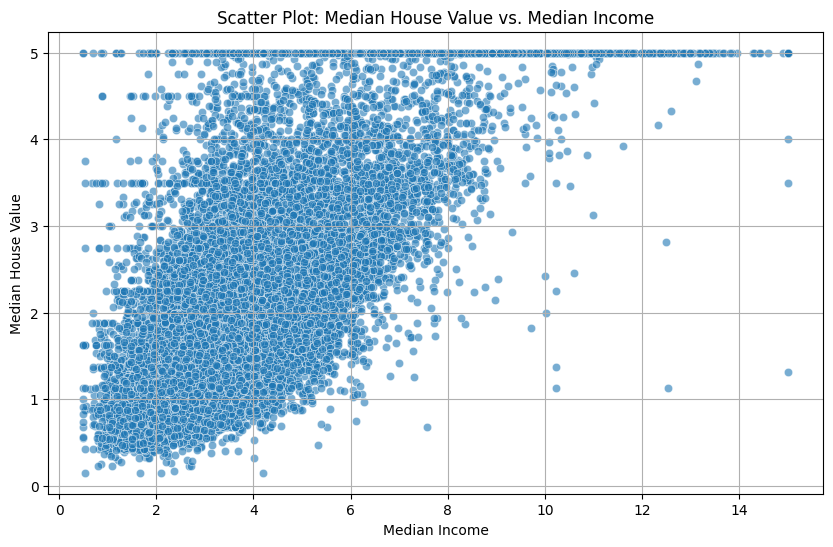

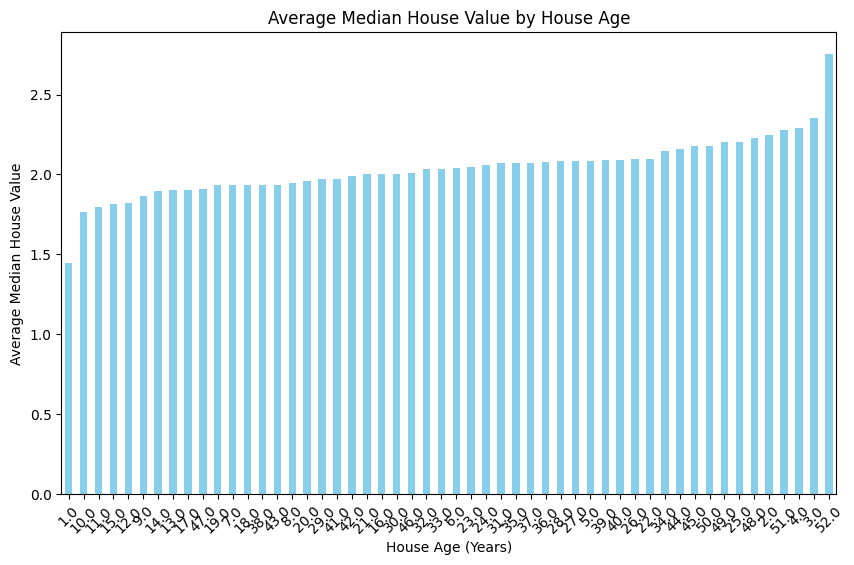

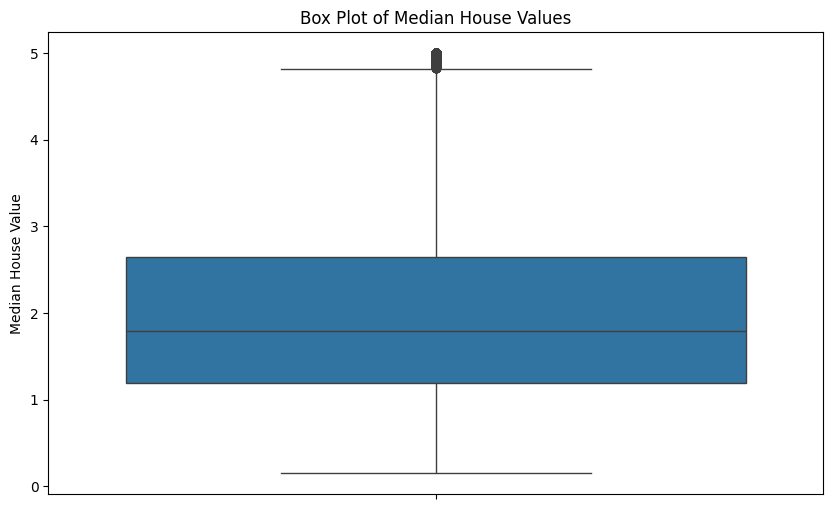

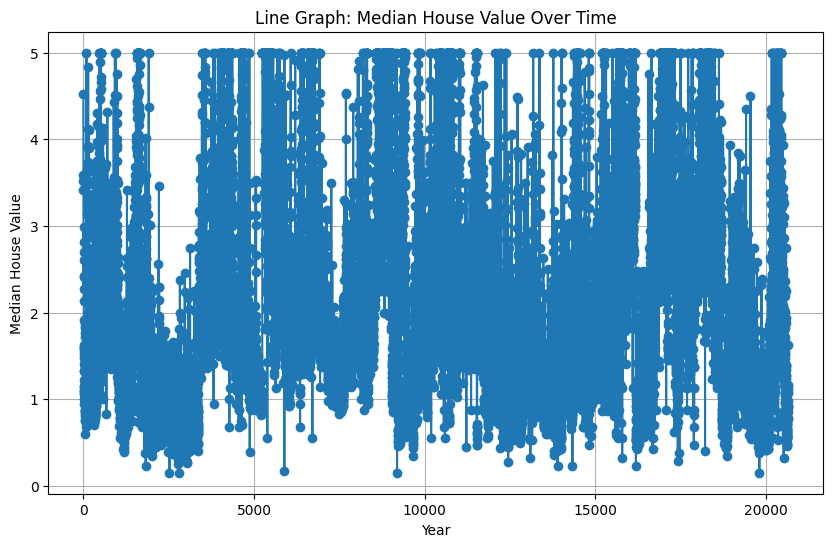

In [ ]:
import pandas as pd
import folium
from folium.plugins import HeatMap, MarkerCluster
from sklearn.datasets import fetch_california_housing
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Load the California housing dataset
housing = fetch_california_housing(as_frame=True)
df = housing.frame

# Step 2: Create a base map centered around the mean latitude and longitude
m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=6)

# Step 3: Prepare data for the heatmap
heat_data = [[row['Latitude'], row['Longitude'], row['MedHouseVal']] for index, row in df.iterrows()]

# Step 4: Create a HeatMap layer
heatmap = HeatMap(heat_data, radius=15, blur=10, max_zoom=1)
m.add_child(heatmap)

# Step 5: Create a Marker Cluster for high-value areas
marker_cluster = MarkerCluster().add_to(m)

# Step 6: Add markers for areas with high median house values
high_value_threshold = df['MedHouseVal'].quantile(0.75)  # Top 25% of house values
for index, row in df.iterrows():
    if row['MedHouseVal'] >= high_value_threshold:
        folium.Marker(
            location=[row['Latitude'], row['Longitude']],
            popup=f"Median House Value: ${row['MedHouseVal']:.2f}<br>Population: {row['Population']}",
            icon=folium.Icon(color='green', icon='info-sign')
        ).add_to(marker_cluster)

# Step 7: Add Layer Control
folium.LayerControl().add_to(m)

# Step 8: Add a title and description to the map
title_html = '''
             <h3 align="center" style="font-size: 20px"><b>California Housing Market Analysis</b></h3>
             <h4 align="center" style="font-size: 14px">This map visualizes median house values across California, highlighting areas with high property values and dense populations.</h4>
             '''
m.get_root().html.add_child(folium.Element(title_html))

# Step 9: Save and display the map
m.save('california_housing_heatmap_enhanced.html')
m  # Display the map in a Jupyter Notebook (if applicable)

# Visualization Section

# Scatter Plot: Median House Value vs. Median Income
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='MedInc', y='MedHouseVal', alpha=0.6)
plt.title('Scatter Plot: Median House Value vs. Median Income')
plt.xlabel('Median Income')
plt.ylabel('Median House Value')
plt.grid()
plt.show()

# Bar Chart: Average Median House Value by House Age
avg_house_value_by_age = df.groupby('HouseAge')['MedHouseVal'].mean().sort_values()
plt.figure(figsize=(10, 6))
avg_house_value_by_age.plot(kind='bar', color='skyblue')
plt.title('Average Median House Value by House Age')
plt.xlabel('House Age (Years)')
plt.ylabel('Average Median House Value')
plt.xticks(rotation=45)
plt.show()

# Box Plot: Distribution of Median House Values
plt.figure(figsize=(10, 6))
sns.boxplot(y='MedHouseVal', data=df)
plt.title('Box Plot of Median House Values')
plt.ylabel('Median House Value')
plt.show()

# Line Graph: Median House Value Over Time (Assuming you have a 'Year' column)
# For demonstration, let's create a hypothetical 'Year' column based on the index
df['Year'] = pd.Series(range(len(df)))  # Replace this with actual year data if available
median_house_value_by_year = df.groupby('Year')['MedHouseVal'].mean()

plt.figure(figsize=(10, 6))
median_house_value_by_year.plot(kind='line', marker='o')
plt.title('Line Graph: Median House Value Over Time')
plt.xlabel('Year')
plt.ylabel('Median House Value')
plt.grid()
plt.show()